
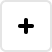
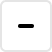
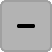
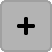
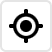
...
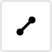
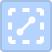
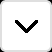
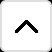
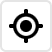

In [1]:
import os
import sys

parent_dir = os.path.abspath("..")
if parent_dir not in sys.path:
    sys.path.append(parent_dir)
from magick_benchmark_utils import benchmark_mvg_save

from functools import partial
from IPython.display import Image

import pandas as pd
import numpy as np

from lets_plot import *
LetsPlot.setup_html()

In [2]:
def path_plot(n):
    # 1. Configuration
    POINTS_PER_OBJECT = 1000  # Fixed complexity per island
    
    # Calculate how many objects we need to reach roughly 'n' points
    num_objects = max(1, int(n / POINTS_PER_OBJECT))
    
    # Re-adjust actual N so arrays match perfectly (optional, but clean)
    actual_n_per_obj = POINTS_PER_OBJECT
    
    # 2. Create the Template (One Spiky Island)
    np.random.seed(42) # Consistent shape every time
    theta = np.linspace(0, 2 * np.pi, actual_n_per_obj)
    
    # Create a "gear" shape
    base_radius = 10.0
    spikes = 2.0 * np.sin(12 * theta) # 12 spikes per object
    jitter = np.random.normal(0, 0.2, actual_n_per_obj)
    r = base_radius + spikes + jitter
    
    template_x = r * np.cos(theta)
    template_y = r * np.sin(theta)
    
    # 3. Create the Grid Offsets
    # We want a roughly square grid (rows ~ cols)
    cols = int(np.ceil(np.sqrt(num_objects)))
    rows = int(np.ceil(num_objects / cols))
    
    # Generate X and Y offsets
    spacing = 30.0 # Enough space so they don't overlap
    
    all_x = []
    all_y = []
    all_ids = []
    
    obj_count = 0
    for row in range(rows):
        for col in range(cols):
            if obj_count >= num_objects:
                break
                
            # Shift the template to the new grid position
            center_x = col * spacing
            center_y = row * spacing
            
            all_x.append(template_x + center_x)
            all_y.append(template_y + center_y)
            
            # Create an ID array for this object (e.g., [0, 0, ...], [1, 1, ...])
            # This is vital for geom_path to know when to "lift the pen"
            all_ids.append(np.full(actual_n_per_obj, obj_count))
            
            obj_count += 1
            
    # 4. Flatten arrays for Lets-Plot
    x_final = np.concatenate(all_x)
    y_final = np.concatenate(all_y)
    ids_final = np.concatenate(all_ids)
    
    # 5. Plot
    # Note: group='id' tells geom_path these are separate islands
    return ggplot({'x': x_final, 'y': y_final, 'id': ids_final}, aes('x', 'y')) \
        + geom_path(aes(group='id')) \
        + coord_fixed() \
        + theme_void() \
        + guides(color='none')

path_plot(50_000)

In [3]:
def polygon_plot(n):
    # 1. Configuration
    POINTS_PER_OBJECT = 1000  # Fixed complexity per island
    
    # Calculate how many objects we need to reach roughly 'n' points
    num_objects = max(1, int(n / POINTS_PER_OBJECT))
    
    # Re-adjust actual N so arrays match perfectly (optional, but clean)
    actual_n_per_obj = POINTS_PER_OBJECT
    
    # 2. Create the Template (One Spiky Island)
    np.random.seed(42) # Consistent shape every time
    theta = np.linspace(0, 2 * np.pi, actual_n_per_obj)
    
    # Create a "gear" shape
    base_radius = 10.0
    spikes = 2.0 * np.sin(12 * theta) # 12 spikes per object
    jitter = np.random.normal(0, 0.2, actual_n_per_obj)
    r = base_radius + spikes + jitter
    
    template_x = r * np.cos(theta)
    template_y = r * np.sin(theta)
    
    # 3. Create the Grid Offsets
    # We want a roughly square grid (rows ~ cols)
    cols = int(np.ceil(np.sqrt(num_objects)))
    rows = int(np.ceil(num_objects / cols))
    
    # Generate X and Y offsets
    spacing = 30.0 # Enough space so they don't overlap
    
    all_x = []
    all_y = []
    all_ids = []
    
    obj_count = 0
    for row in range(rows):
        for col in range(cols):
            if obj_count >= num_objects:
                break
                
            # Shift the template to the new grid position
            center_x = col * spacing
            center_y = row * spacing
            
            all_x.append(template_x + center_x)
            all_y.append(template_y + center_y)
            
            # Create an ID array for this object (e.g., [0, 0, ...], [1, 1, ...])
            # This is vital for geom_path to know when to "lift the pen"
            all_ids.append(np.full(actual_n_per_obj, obj_count))
            
            obj_count += 1
            
    # 4. Flatten arrays for Lets-Plot
    x_final = np.concatenate(all_x)
    y_final = np.concatenate(all_y)
    ids_final = np.concatenate(all_ids)
    
    # 5. Plot
    # Note: group='id' tells geom_path these are separate islands
    return ggplot({'x': x_final, 'y': y_final, 'id': ids_final}, aes('x', 'y')) \
        + geom_polygon(aes(group='id')) \
        + coord_fixed() \
        + theme_void() \
        + guides(color='none')

polygon_plot(10_000)

In [4]:
def random_path_plot(n):
    np.random.seed(42)
    
    x = np.random.uniform(size=n)
    y = np.random.uniform(size=n)
    v = np.random.normal(size=n)

    return ggplot({'x': x, 'y': y}, aes('x', 'y')) \
        + geom_path()

random_path_plot(1_000)

In [5]:
def random_polygon_plot(n):
    np.random.seed(42)
    
    x = np.random.uniform(size=n)
    y = np.random.uniform(size=n)
    v = np.random.normal(size=n)

    return ggplot({'x': x, 'y': y}, aes('x', 'y')) \
        + geom_polygon()

random_polygon_plot(1_000)

In [6]:
ns = [1_000, 2_000, 5_000, 10_000, 25_000, 50_000]

dfs = []

dfs.append(pd.DataFrame(benchmark_mvg_save(ns, partial(path_plot), file_prefix="path_regular", scale=1, timeout=60)))
dfs.append(pd.DataFrame(benchmark_mvg_save(ns, partial(path_plot), file_prefix="path_regular", scale=2, timeout=60)))

dfs.append(pd.DataFrame(benchmark_mvg_save(ns, partial(polygon_plot), file_prefix="polygon_regular", scale=1, timeout=60)))
dfs.append(pd.DataFrame(benchmark_mvg_save(ns, partial(polygon_plot), file_prefix="polygon_regular", scale=2, timeout=60)))

dfs.append(pd.DataFrame(benchmark_mvg_save(ns, partial(random_path_plot), file_prefix="path_random", scale=1, timeout=60)))
dfs.append(pd.DataFrame(benchmark_mvg_save(ns, partial(random_path_plot), file_prefix="path_random", scale=2, timeout=60)))

dfs.append(pd.DataFrame(benchmark_mvg_save(ns, partial(random_polygon_plot), file_prefix="polygon_random", scale=1, timeout=60)))
dfs.append(pd.DataFrame(benchmark_mvg_save(ns, partial(random_polygon_plot), file_prefix="polygon_random", scale=2, timeout=60)))

df = pd.concat(dfs, ignore_index=True)

path_regular@1x
[1/6] n=1000 (0.3551s)
[2/6] n=2000 (0.3623s)
[3/6] n=5000 (0.5320s)
[4/6] n=10000 (0.8325s)
[5/6] n=25000 (1.2887s)
[6/6] n=50000 (2.1470s)
path_regular@2x
[1/6] n=1000 (0.7315s)
[2/6] n=2000 (0.8105s)
[3/6] n=5000 (1.3096s)
[4/6] n=10000 (1.8129s)
[5/6] n=25000 (3.0816s)
[6/6] n=50000 (5.2857s)
polygon_regular@1x
[1/6] n=1000 (0.3700s)
[2/6] n=2000 (0.4211s)
[3/6] n=5000 (0.7210s)
[4/6] n=10000 (0.9169s)
[5/6] n=25000 (1.8532s)
[6/6] n=50000 (2.9746s)
polygon_regular@2x
[1/6] n=1000 (0.7561s)
[2/6] n=2000 (0.8257s)
[3/6] n=5000 (1.4840s)
[4/6] n=10000 (2.5731s)
[5/6] n=25000 (4.4706s)
[6/6] n=50000 (9.0855s)
path_random@1x
[1/6] n=1000 (1.0514s)
[2/6] n=2000 (2.2533s)
[3/6] n=5000 (5.5864s)
[4/6] n=10000 (10.6660s)
[5/6] n=25000 (29.0151s)
[6/6] n=50000 (TIMEOUT)
path_random@2x


[1/6] n=1000 (4.7127s)
[2/6] n=2000 (9.7572s)
[3/6] n=5000 (29.4471s)
[4/6] n=10000 (TIMEOUT)
[5/6] n=25000 (SKIPPED - previous timeout)
[6/6] n=50000 (SKIPPED - previous timeout)
polygon_random@1x


[1/6] n=1000 (1.2951s)
[2/6] n=2000 (2.5123s)
[3/6] n=5000 (6.4129s)
[4/6] n=10000 (13.5237s)
[5/6] n=25000 (53.3059s)
[6/6] n=50000 (TIMEOUT)
polygon_random@2x


[1/6] n=1000 (6.1119s)
[2/6] n=2000 (12.4378s)
[3/6] n=5000 (37.4405s)
[4/6] n=10000 (TIMEOUT)
[5/6] n=25000 (SKIPPED - previous timeout)
[6/6] n=50000 (SKIPPED - previous timeout)


In [7]:
df.head()

,n,prefix,scale,time_map,time_paint,time_snapshot,time_total,error
0,1000,path_regular,1,0.044595,0.003644,0.306816,0.355055,NaN
1,2000,path_regular,1,0.033122,0.003801,0.325364,0.362287,NaN
2,5000,path_regular,1,0.057972,0.006207,0.467851,0.532030,NaN
3,10000,path_regular,1,0.129837,0.014063,0.688641,0.832542,NaN
4,25000,path_regular,1,0.299958,0.073570,0.915153,1.288681,NaN


In [8]:
ggplot(df) + geom_line(aes(x='n', y='time_snapshot', color=as_discrete('scale'))) + facet_grid(x='prefix', x_order=-1)

In [9]:
df.to_csv("path_variant_optimized.csv", index=False)